エレキベースを手に入れたので、音を録音して色々やってみます。

まずは必要となるパッケージを読み込みます。`LibSndFile`は音ファイルの読み書き、`SampledSignals`は音サンプル操作、`Plots`はグラフ描画用です。まだインストールされていない場合には`Pkg.add("パッケージ名")`で導入して下さい。

In [7]:
using FileIO: load, save
import LibSndFile
using SampledSignals, Plots, FFTW
pyplot();

まずは音を読み込みます。主にこれ以降のタイプ量を減らすのを目的として、各サンプルのデータを`x`に、標本化周波数を`fs`に格納します。

In [8]:
snd = load("20180203_electric_bass_open.flac");
fs = snd.samplerate;
x = snd.data;

全体像を見てみましょう。`LibSndFile`の機能をそのまま使うと、簡易的に波形表示を見ることができます（JavaScript対応ブラウザなら音の再生もできます）。行末にセミコロンを付けなければ計算結果が表示されるのと同じようなかんじです。

In [9]:
snd

5317632-frame, 1-channel SampleBuf{FixedPointNumbers.Fixed{Int32,31}, 2}
120.58122448979591s sampled at 44100.0Hz
▁▁▅▅▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▅▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▅▄▄▃▃▂▂▂▁▁▁▁▁▁▁▁▅▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁

自分でプロットするには以下のようにします。`t`に各サンプルの時刻を計算し、グラフの横軸の値として使います。

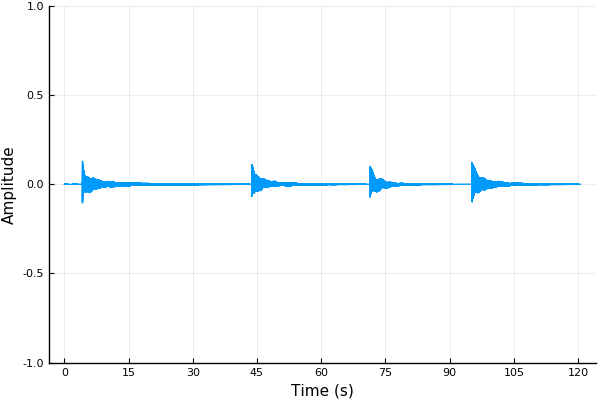

In [10]:
t = (0:length(x)-1) / fs;
plot(t, x,
    xlabel="Time (s)", ylabel="Amplitude",
    xticks=0:15:t[end],
    ylim=(-1, +1),
    legend=false)

このファイルは開放弦（E1、A1、D2、G2）を順番に一回ずつ演奏したもので、4音が並んで入っています。先頭にあるE1音のみを、3.85秒〜41.00秒と範囲指定して抜き出します。ただし秒数ではなくサンプル数で指定する必要があるので、秒数に標本化周波数をかけてサンプル数を計算します。また、そのままだと実数型なので、整数型（Int）に変換するために`round()`を使っています。

`xE1`はE1音の振幅が、`tE1`は各サンプルの時刻が入ります。

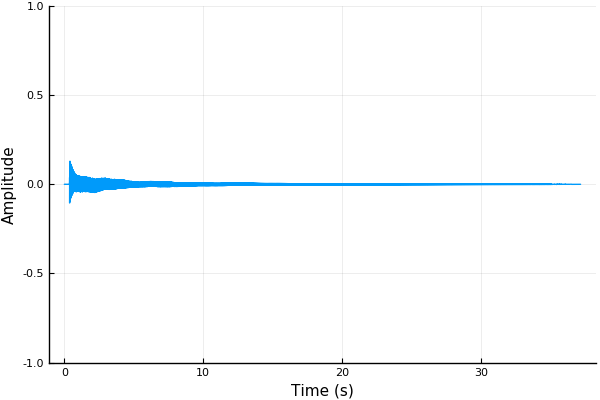

In [11]:
xE1 = x[round(Int, 3.850*fs) : round(Int, 41.000*fs)];
tE1 = (0:length(xE1)-1) / fs;
plot(tE1, xE1,
    xlabel="Time (s)", ylabel="Amplitude",
    ylim=(-1, +1),
    legend=false)

波形の詳細がどういう風になっているのか調べるために、一部分だけを拡大してみます。たとえば、x軸で2.7秒〜2.8秒の部分だけを拡大表示するときには`xlim=(2.7, 2.8)`とします。同様に、`ylim`を使ってy軸についても拡大して、波形を見てみます。

すると似た波形が繰り返し現れているのが分かります。波長は24.0〜24.5ミリ秒くらいでしょうか。1 / 0.0245 = 40.8 Hz、1 / 0.024 = 41.3 Hzですので、だいたい41 Hzくらいが基本周波数のようです。

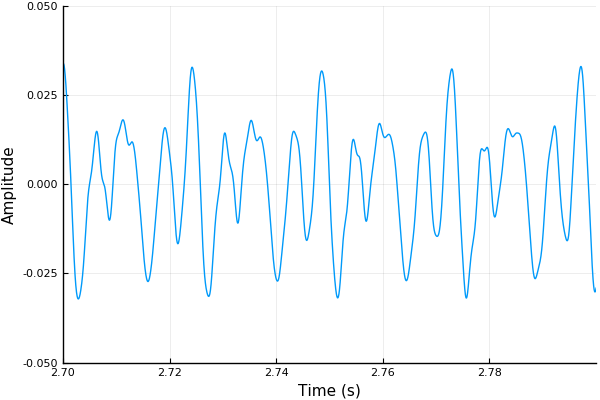

In [12]:
plot(tE1, xE1,
    xlabel="Time (s)", ylabel="Amplitude",
    xlim=(2.7, 2.8),
    ylim=(-0.05, +0.05),
    legend=false)

スペクトルを見てみましょう。`fft()`でフーリエ変換して、パワースペクトルの計算をしています。

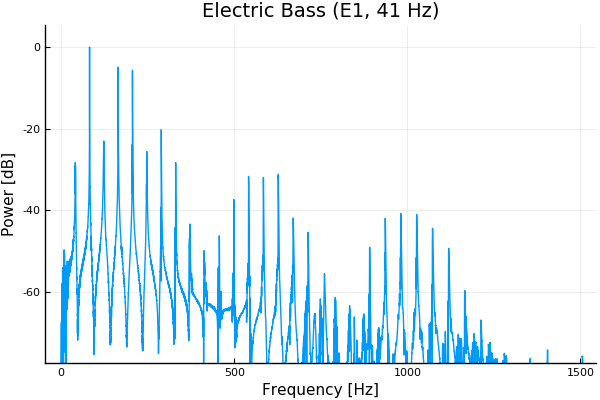

In [14]:
yE1 = fft(xE1);
ampspecE1 = abs.(yE1[1:round(Int, length(yE1)/2+1)]);
ampspecE1[2:round(Int, length(ampspecE1)-1)] *= 2.0;
f = (0:length(ampspecE1)) / length(ampspecE1) * (fs / 2);
ampspecE1dB = 20 * log10.(ampspecE1);
plot(f, ampspecE1dB .- maximum(ampspecE1dB),
    xlim=[0, 1500], ylim=[-75, 3],
    xlabel="Frequency [Hz]", ylabel="Power [dB]",
    title="Electric Bass (E1, 41 Hz)", legend=false)

倍音成分がだいたい41の倍数の周波数のところに出ていることが分かります。440 Hzを基準にチューニングしたときのE1の基本周波数は41.2 Hzなので、FFTの結果からも、それに相当した基本周波数であることが分かります。

また、400 Hz付近と800 Hz付近に谷ができています。弦楽器は弾弦位置によってスペクトル包絡が変化するのですが、これらの谷はそれによるものです。